In [1]:
import pandas as pd
import os
import sys
from glob import glob
import shutil
import PIL.Image
from tqdm import tqdm
import numpy as np
from matplotlib import pyplot as plt
from sklearn.utils import shuffle

os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="0"

from keras.applications.vgg16 import VGG16
from keras.layers import Input,GlobalAveragePooling2D,Activation
from keras.layers.convolutional import Conv2D
from keras.layers.core import Flatten, Dense, Dropout
from keras.layers.merge import Concatenate
from keras.layers.normalization import BatchNormalization
from keras.models import Sequential, Model
from keras.callbacks import CSVLogger, ModelCheckpoint
from keras.models import model_from_json
from sklearn.metrics import classification_report
from keras.optimizers import Adam
from keras.utils.np_utils import to_categorical
import keras.backend     as K
from keras import metrics

from IPython.display import Image
from IPython.core.display import HTML 

Using TensorFlow backend.
/opt/conda/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


In [2]:
def short(df):
    return df.drop(IMG,axis=1)

def describe_dataset(lfw_path):
    persons = os.listdir(lfw_path)

    data = []
    for person in persons:
        nr_files = len(os.listdir(os.path.join(lfw_path,person)))
        data.append((person,nr_files))

    data_df = pd.DataFrame(data,columns=["person","count"])

    display(data_df.sort_values("count",ascending=False).head(100))
    
    
def show_images(df,nr_images = None, label = None, with_pred = False):
    if nr_images is None:
        nr_images = len(df)
        
    draw_df = df if label is None else df[df[LABEL] == label]
    
    for _,row in draw_df[:nr_images].iterrows():
        if with_pred:
            print(f"Label: {row[LABEL]}")
            print(f"Pred : {row[PRED_LABEL]}")
            
        plt.imshow(row[IMG])
        plt.show()
        
def read_df(input_folder, nr_imgs = None):
    label = os.path.basename(input_folder)
    img_paths = glob(input_folder+"/*")
    if nr_imgs is not None:
        img_paths = img_paths[:nr_imgs]

    data_df = pd.DataFrame(img_paths,columns = [IMG_PATH])
    data_df[LABEL] = label
    data_df[IMG_NAME] = data_df[IMG_PATH].apply(os.path.basename)
    data_df[IMG] = data_df[IMG_PATH].apply(lambda p: np.asarray(PIL.Image.open(p).resize((250,250))))
    
    return data_df

def add_ohe_label_col(df):
    label_data_indexed = [class_2_index[label] for label in df[LABEL].values]
    label_data_ohe = to_categorical(np.asarray(label_data_indexed))
    df[LABEL_OHE] = pd.Series([d for d in label_data_ohe],index=df.index)
    return df

def build_model():
    vgg_conv = VGG16(include_top=False,weights='imagenet', input_shape=(250,250,3))
    for layer in vgg_conv.layers:
        layer.trainable = False

    model = Sequential()
    model.add(vgg_conv)
    model.add(Flatten())
    model.add(Dense(1024, activation='relu'))
    model.add(Dense(1024, activation='relu'))
    model.add(Dense(1024, activation='relu'))
    model.add(Dense(len(class_2_index), activation='softmax'))

    model.compile(Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

    return model

def read_data(lfw_path):
    df_list = []
    for path in tqdm(glob(lfw_path+"/*")):
        cat_df = read_df(path,nr_imgs = 500)
        df_list.append(cat_df)

    data_df = pd.concat(df_list)
    data_df = shuffle(data_df,random_state = 0)
    data_df = add_ohe_label_col(data_df)
    
    return data_df

def get_images_and_labels(df):
    images = np.stack(df[IMG])
    labels_ohe = np.stack(df[LABEL_OHE])
    
    return images,labels_ohe


def predict_on_data(data_df,images,model):
    preds = model.predict(images,verbose=1)
    pred_labels = [index_2_class[np.argmax(p)] for p in preds]
    
    data_df[PRED_LABEL] = pred_labels
    data_df[PRED] = [p for p in preds]
    data_df[CORRECT] = data_df[LABEL] == data_df[PRED_LABEL]
    
    return data_df

In [3]:
lfw_path = "/home/docker/apollo/datasets/lfw/tertiary_lfw"


IMG_PATH = "img_path"
IMG_NAME = "img_name"
LABEL = "label"
LABEL_OHE = "label_ohe"
IMG = "img"
PRED_LABEL = "pred_label"
CORRECT = "correct"
PRED = "pred"

PEOPLE_LABEL = 'people'
POWELL_LABEL = 'Colin_Powell'
BUSH_LABEL = 'George_W_Bush'

class_2_index = {p:i for i,p in enumerate(os.listdir(lfw_path))}
index_2_class = {v:k for k,v in class_2_index.items()}


# Problem Description

## Let's mock a "Situation Room"

The Situation Room, conference room and intelligence management center in the basement of the West Wing of the White House. It is run by the National Security Council staff for the use of the President of the United States and his advisors to monitor and deal with crises at home and abroad and to conduct secure communications with outside (often overseas) persons. 

In [4]:
Image(url= "https://upload.wikimedia.org/wikipedia/commons/a/ac/Obama_and_Biden_await_updates_on_bin_Laden.jpg", width = 1000)

# Who has access

## 1) George Bush

In [5]:
Image(url= "https://upload.wikimedia.org/wikipedia/commons/d/d4/George-W-Bush.jpeg", width = 500)

## 2) Collin Power

In [6]:
Image(url= "https://cdn.britannica.com/84/85184-004-2670BC77.jpg", width = 500)

## 3) Nobody else

In [7]:
Image(url= "https://www.sciencenews.org/sites/default/files/2016/09/main/articles/090816_ls_brain-training_free.jpg", width = 500)

# Dataset Description

# Labeled Faces in the Wild (http://vis-www.cs.umass.edu/lfw/)

In [8]:
describe_dataset(lfw_path)

,person,count
0,people,12467
2,George_W_Bush,530
1,Colin_Powell,236


# Read Data

In [9]:
data_df = read_data(lfw_path)

print(data_df.shape)
short(data_df).head()

100%|██████████| 3/3 [00:06<00:00,  2.21s/it]


(1236, 5)


,img_path,label,img_name,label_ohe
224,/home/docker/apollo/datasets/lfw/tertiary_lfw/...,George_W_Bush,George_W_Bush_0145.jpg,"[0.0, 0.0, 1.0]"
152,/home/docker/apollo/datasets/lfw/tertiary_lfw/...,people,Luiz_Inacio_Lula_da_Silva_0014.jpg,"[1.0, 0.0, 0.0]"
420,/home/docker/apollo/datasets/lfw/tertiary_lfw/...,George_W_Bush,George_W_Bush_0069.jpg,"[0.0, 0.0, 1.0]"
1,/home/docker/apollo/datasets/lfw/tertiary_lfw/...,Colin_Powell,Colin_Powell_0047.jpg,"[0.0, 1.0, 0.0]"
125,/home/docker/apollo/datasets/lfw/tertiary_lfw/...,Colin_Powell,Colin_Powell_0172.jpg,"[0.0, 1.0, 0.0]"


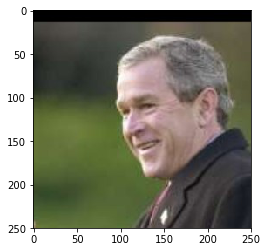

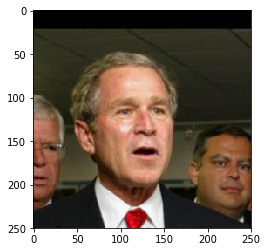

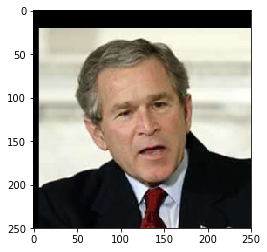

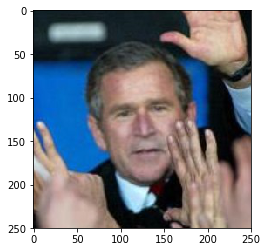

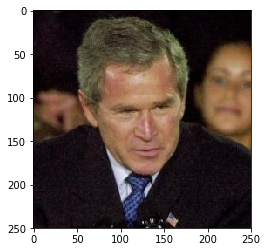

...

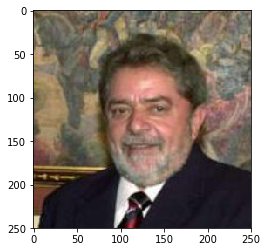

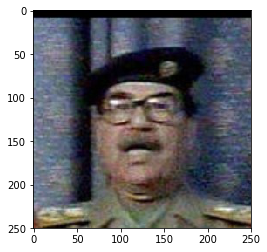

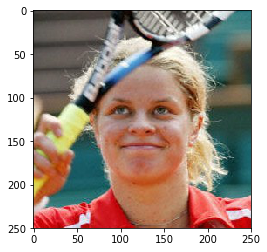

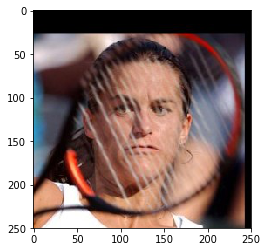

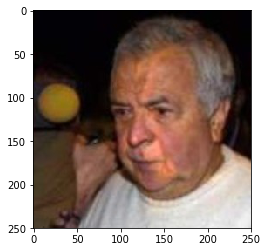

In [10]:
for label in [BUSH_LABEL,POWELL_LABEL,PEOPLE_LABEL]:
    show_images(data_df,nr_images = 5, label = label)

In [11]:
images, labels_ohe = get_images_and_labels(data_df)

print(f"Images: {images.shape}")
print(f"Labels: {labels_ohe.shape}")

Images: (1236, 250, 250, 3)
Labels: (1236, 3)


# Build Model

In [12]:
model = build_model()
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              25691136  
_________________________________________________________________
dense_2 (Dense)              (None, 1024)              1049600   
_________________________________________________________________
dense_3 (Dense)              (None, 1024)              1049600   
_________________________________________________________________
dense_4 (Dense)              (None, 3)                 3075      
Total params: 42,508,099
Trainable params: 27,793,411
Non-trainable params: 14,714,688
_______________________________________________________

# Train Model

In [ ]:
# model.fit(images,
#           labels_ohe,
#           batch_size = 32, 
#           epochs=10,
#           callbacks = [ModelCheckpoint("./models/model_temp.h5", monitor='acc', verbose= 1, save_best_only=True, mode='max')],
#          )

In [13]:
model.load_weights("./models/model_temp.h5")

# Predict

In [14]:
data_df = predict_on_data(data_df,images,model)

1236/1236 [==============================] - 13s 10ms/step


# Evaluate

In [15]:
print(classification_report(data_df[LABEL].values, data_df[PRED_LABEL].values,digits=3))

               precision    recall  f1-score   support

 Colin_Powell      1.000     0.979     0.989       236
George_W_Bush      0.996     0.996     0.996       500
       people      0.988     0.998     0.993       500

  avg / total      0.994     0.994     0.994      1236



In [ ]:
# data_df.to_pickle("./predictions/data_df.pkl")

# Visualize Results

Label: George_W_Bush
Pred : people


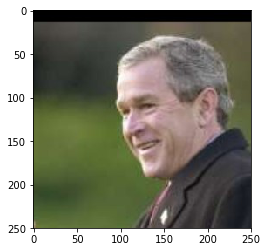

Label: George_W_Bush
Pred : George_W_Bush


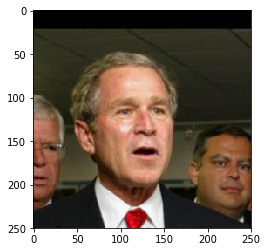

Label: George_W_Bush
Pred : George_W_Bush


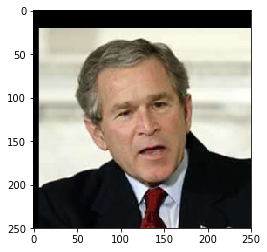

Label: George_W_Bush
Pred : George_W_Bush


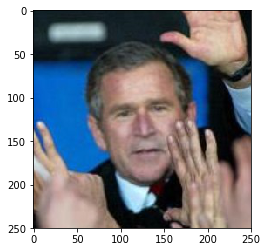

Label: George_W_Bush
Pred : George_W_Bush


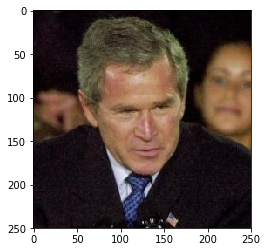

Label: Colin_Powell
Pred : Colin_Powell


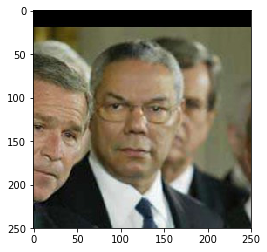

Label: Colin_Powell
Pred : Colin_Powell


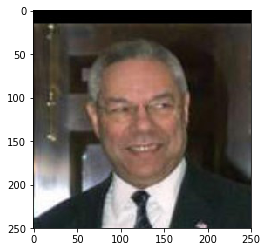

Label: Colin_Powell
Pred : Colin_Powell


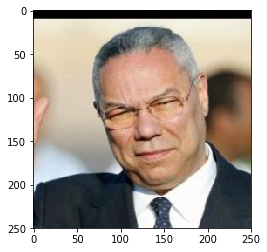

Label: Colin_Powell
Pred : Colin_Powell


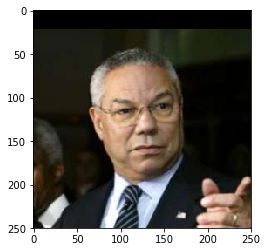

Label: Colin_Powell
Pred : Colin_Powell


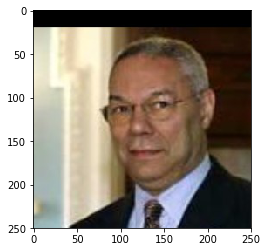

Label: people
Pred : people


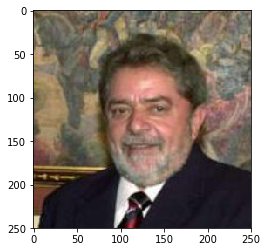

Label: people
Pred : people


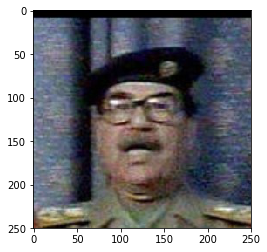

Label: people
Pred : people


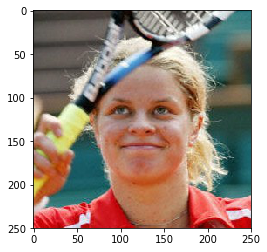

Label: people
Pred : people


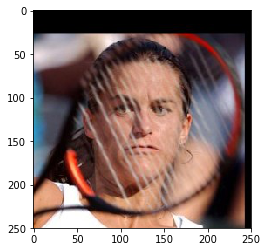

Label: people
Pred : people


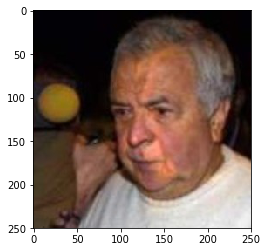

In [16]:
for label in [BUSH_LABEL,POWELL_LABEL,PEOPLE_LABEL]:
    show_images(data_df,nr_images = 5, label = label, with_pred=True)

# Adversarial FGSM

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


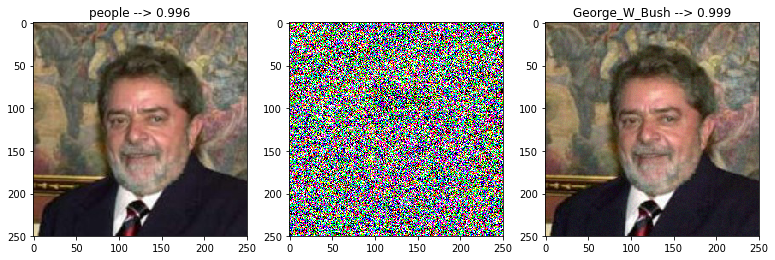

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


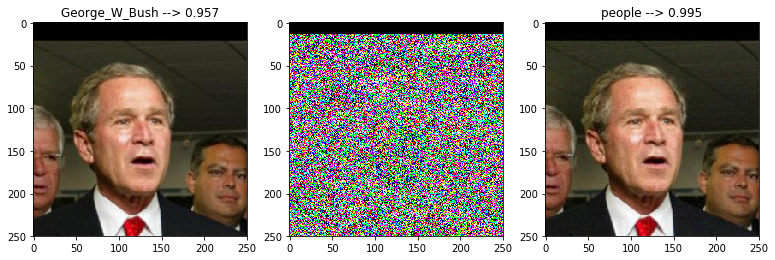

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


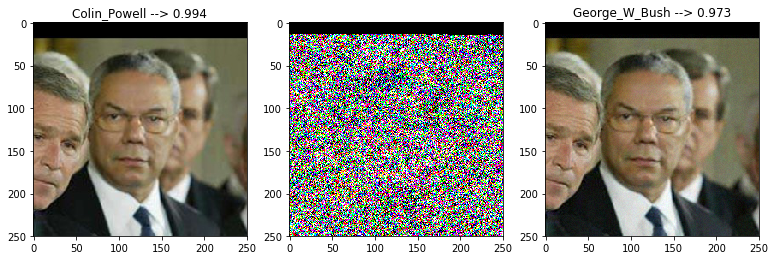

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


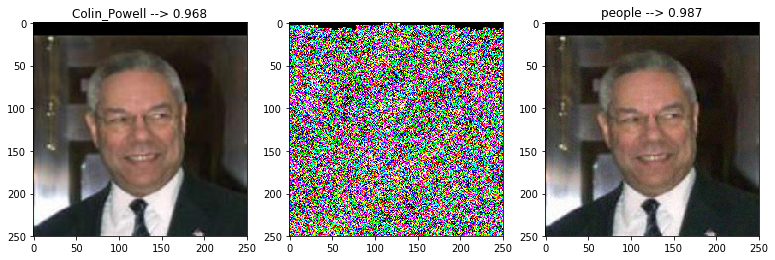

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


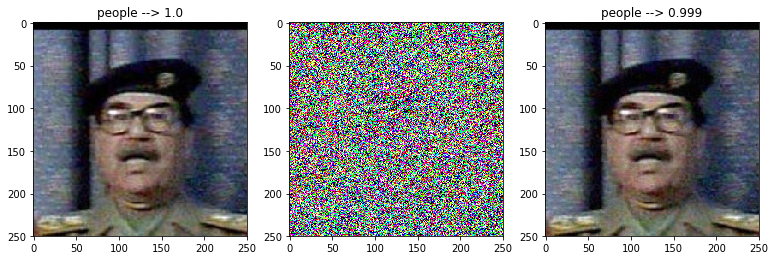

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


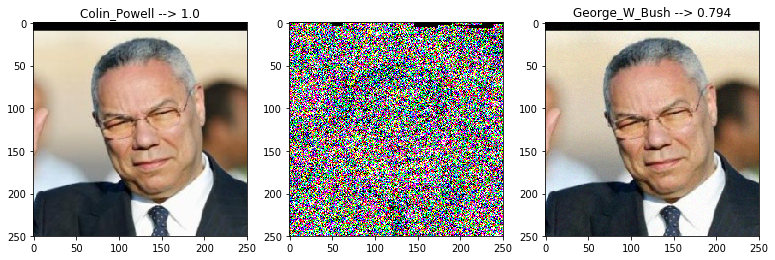

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


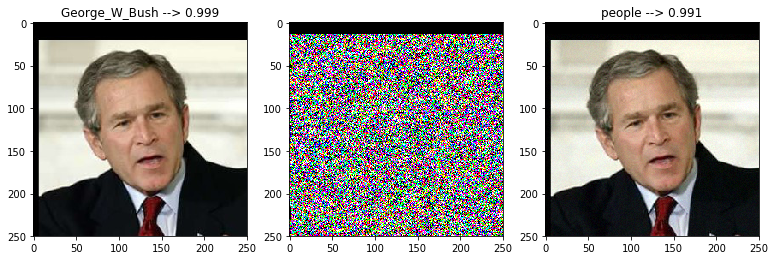

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


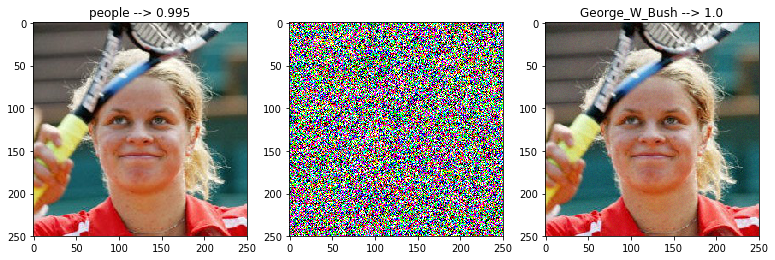

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


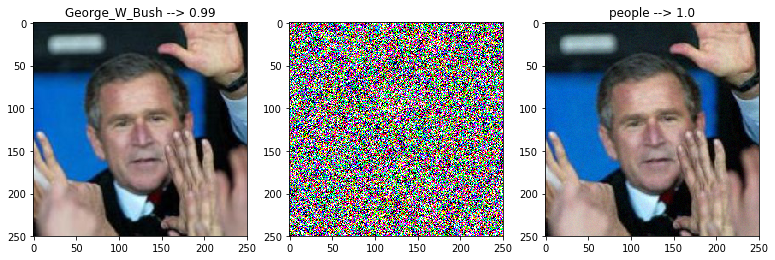

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


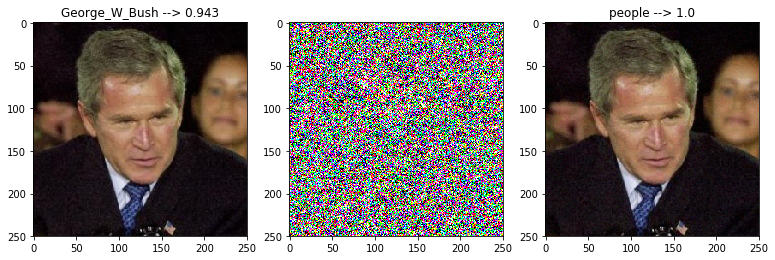

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


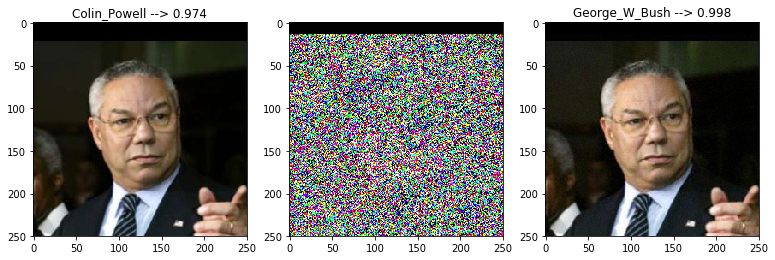

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


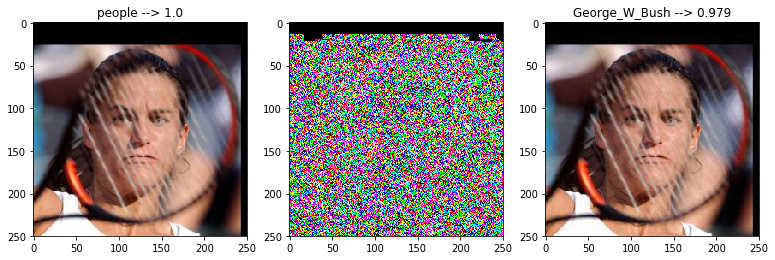

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


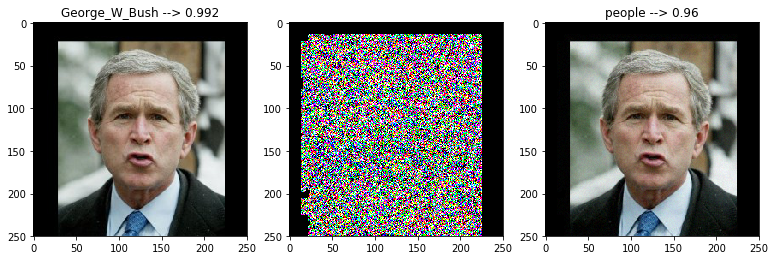

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


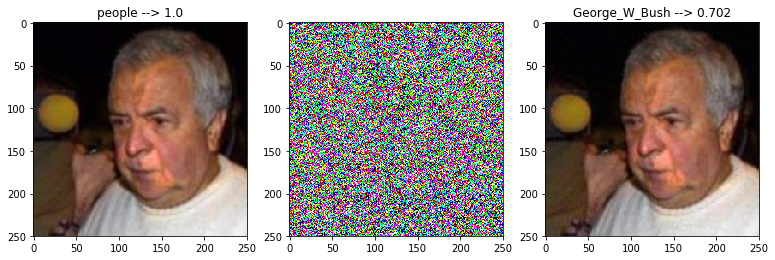

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


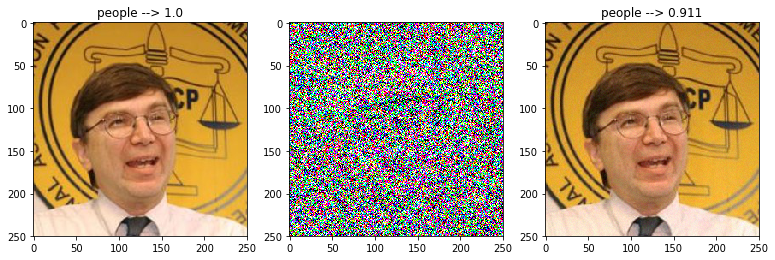

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


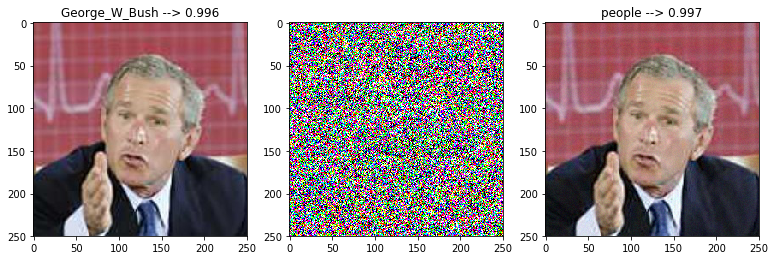

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


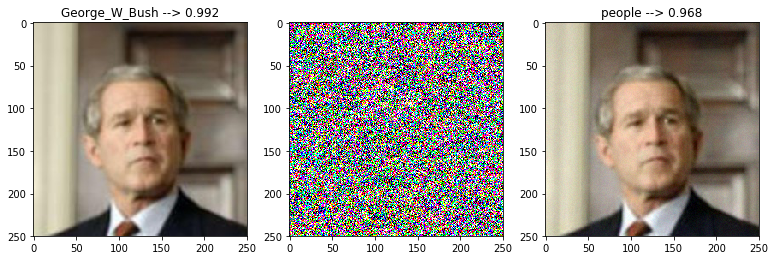

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


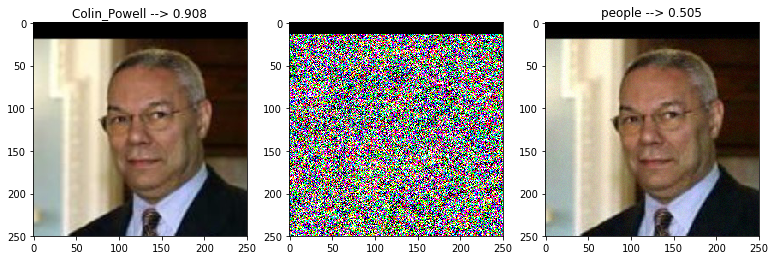

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


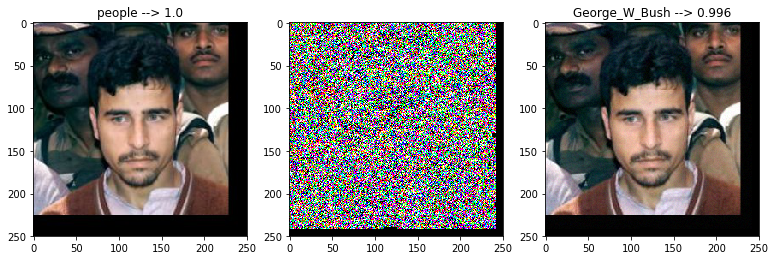

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


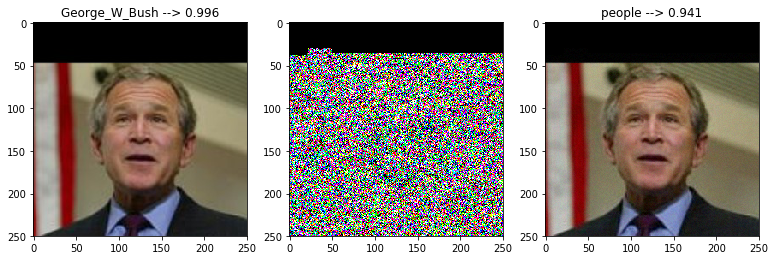

In [17]:
for _, row in list(data_df[data_df[CORRECT]].iterrows())[:20]:
    
    original_array = np.expand_dims(row[IMG],axis=0) 
    original_label_ohe = row[LABEL_OHE]
    original_pred_label = row[LABEL]
    original_pred = str(round(np.max(row[PRED]),3))
    
    plt.figure(figsize=(13,13))
    plt.subplot(1,3,1)
    plt.title(f"{original_pred_label} --> {original_pred}")
    plt.imshow(np.squeeze(original_array))

    
    ################### ADVERSARIAL CODE #######################
    
    target_variable = K.variable(original_label_ohe)
    loss            = metrics.categorical_crossentropy(model.output, target_variable)
    gradients       = K.gradients(loss, model.input)
    get_grad_values = K.function([model.input], gradients)
    grad_values     = get_grad_values([original_array])[0]
    grad_signs      = np.sign(grad_values)
    
    epsilon         = 4
    perturbation    = grad_signs * epsilon
    modified_array  = original_array + perturbation
    modified_array  = np.clip(modified_array, 0., 255.).astype(np.uint8)
    
    ################### ADVERSARIAL CODE #######################
    
    plt.subplot(1,3,2)
    plt.imshow(np.squeeze(perturbation))

    modified_pred_arr = model.predict(modified_array)
    modified_pred_label = index_2_class[np.argmax(modified_pred_arr)]
    modified_pred = str(round(np.max(modified_pred_arr),3))
    
    plt.subplot(1,3,3)
    plt.title(f"{modified_pred_label} --> {modified_pred}")
    plt.imshow(np.squeeze(modified_array))
    plt.show()


# Adversarial Targeted FGSM

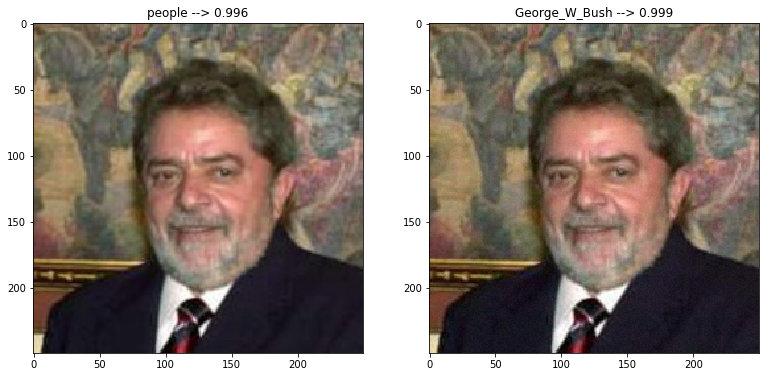

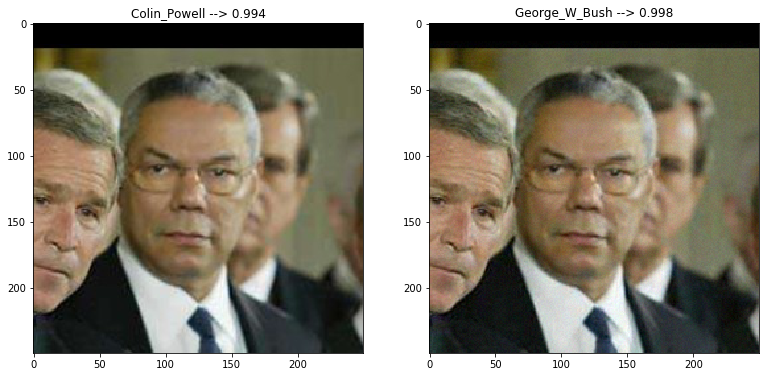

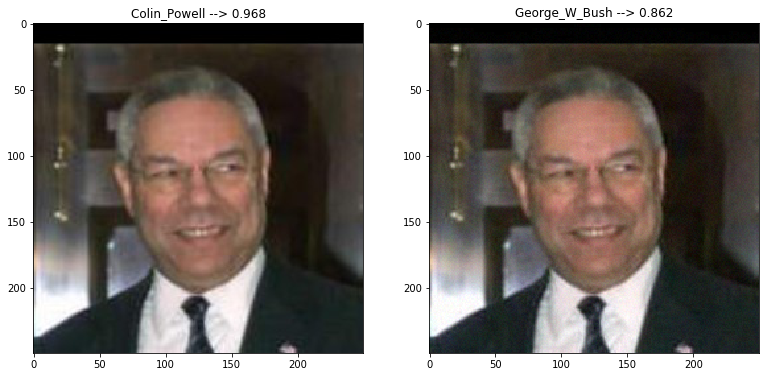

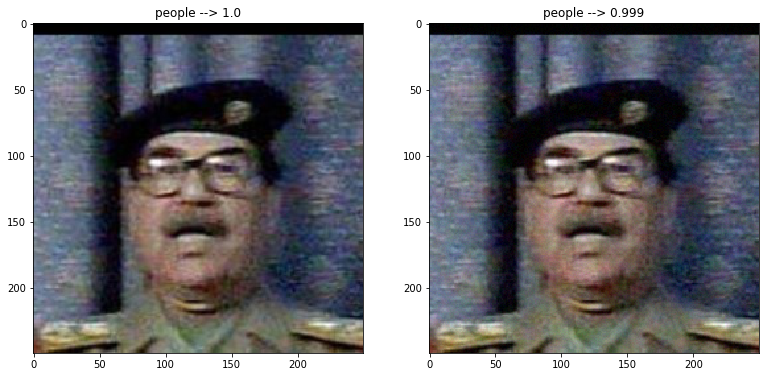

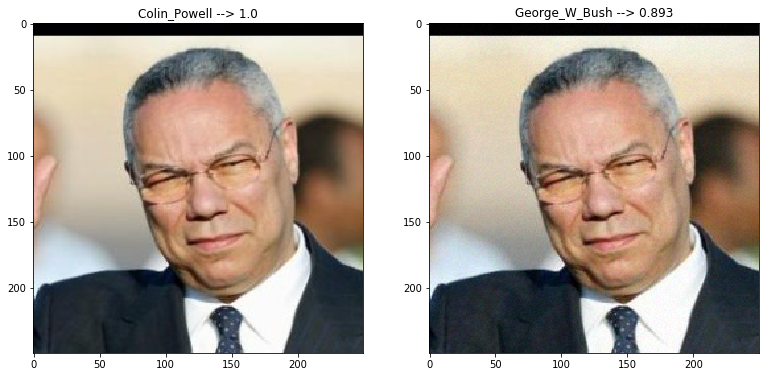

...

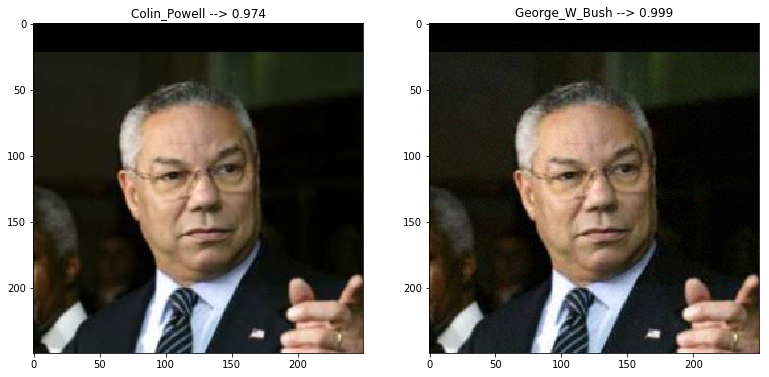

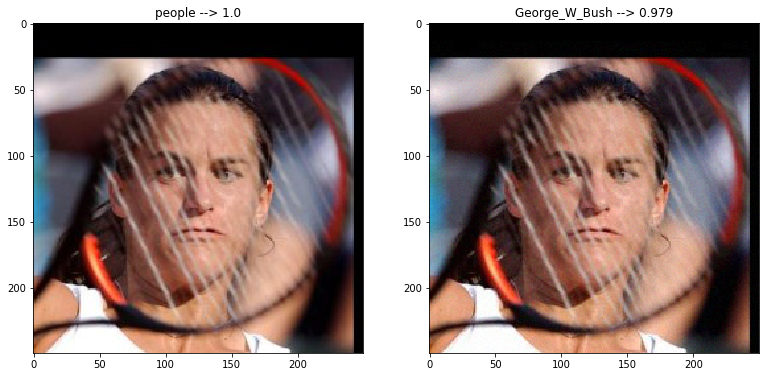

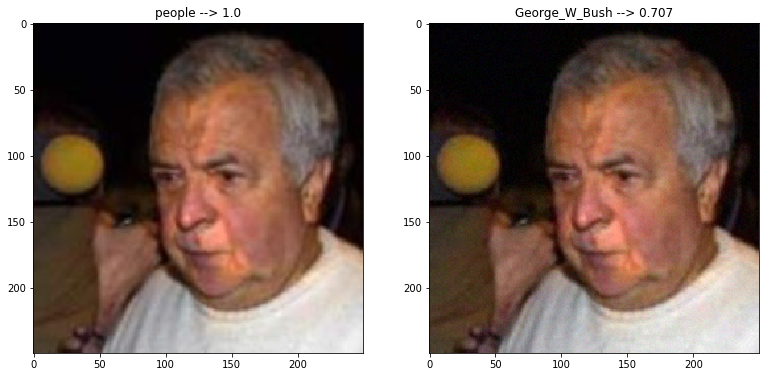

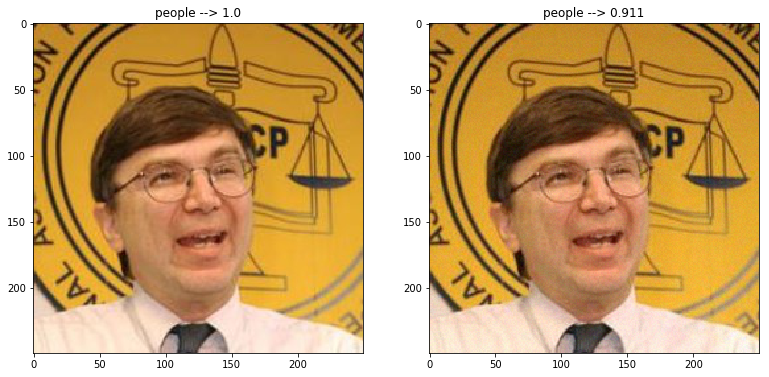

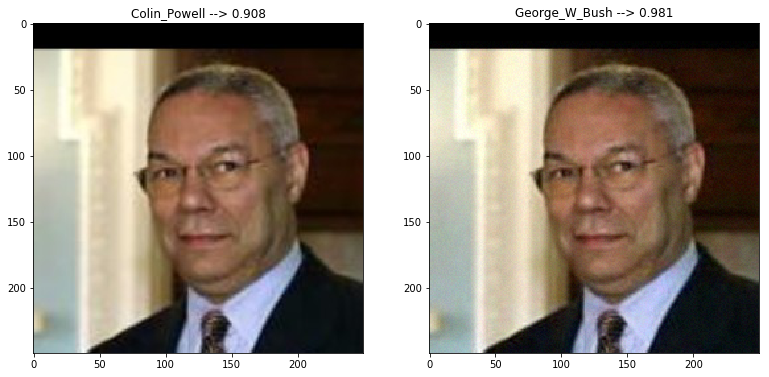

KeyboardInterrupt: 

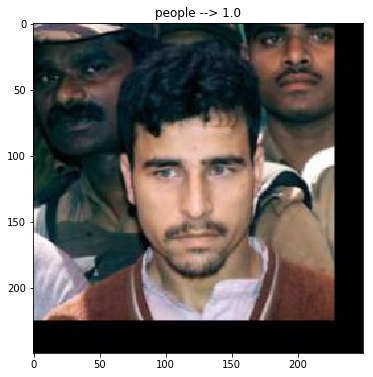

In [18]:
for _, row in list(data_df[(data_df[CORRECT]) & (data_df[LABEL] != BUSH_LABEL)].iterrows())[:20]:
    
    original_array = np.expand_dims(row[IMG],axis=0)
    original_label_ohe = row[LABEL_OHE]
    original_pred_label = row[LABEL]
    original_pred = str(round(np.max(row[PRED]),3))
    
    plt.figure(figsize=(13,13))
    plt.subplot(1,2,1)
    plt.title(f"{original_pred_label} --> {original_pred}")
    plt.imshow(np.squeeze(original_array))

    ################### ADVERSARIAL CODE #######################
    
    target          = [0.0, 0.0, 1.0] # ohe label for Bush
    target_variable = K.variable(target)
    loss            = metrics.categorical_crossentropy(model.output, target_variable)
    gradients       = K.gradients(loss, model.input)
    get_grad_values = K.function([model.input], gradients)
    grad_values     = get_grad_values([original_array])[0]
    grad_signs      = np.sign(grad_values)
    
    epsilon         = 4
    perturbation    = grad_signs * epsilon
    modified_array  = original_array - perturbation
    modified_array = np.clip(modified_array, 0., 255.).astype(np.uint8)
    
    ################### ADVERSARIAL CODE #######################
    
    modified_pred_arr = model.predict(modified_array)
    modified_pred_label = index_2_class[np.argmax(modified_pred_arr)]
    modified_pred = str(round(np.max(modified_pred_arr),3))
    
    plt.subplot(1,2,2)
    plt.title(f"{modified_pred_label} --> {modified_pred}")
    plt.imshow(np.squeeze(modified_array))
    plt.show()


# Let's have some fun !

In [19]:
other_imgs_path = "/home/docker/apollo/datasets/lfw/adv_test/"

test_df = read_data(other_imgs_path)

test_images, test_labels_ohe = get_images_and_labels(test_df)

print(f"Images: {test_images.shape}")

100%|██████████| 1/1 [00:00<00:00,  4.38it/s]


Images: (2, 250, 250, 3)


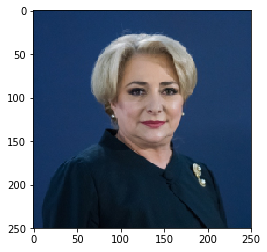

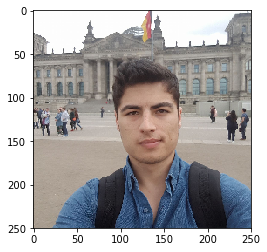

In [20]:
show_images(test_df, with_pred=False)

In [21]:
test_df = predict_on_data(test_df,test_images,model)

2/2 [==============================] - 1s 697ms/step


Label: people
Pred : people


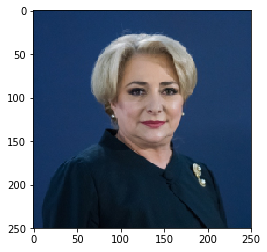

Label: people
Pred : people


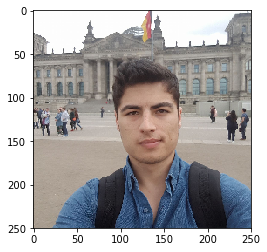

In [22]:
show_images(test_df, with_pred=True)

In [ ]:
# test_df.to_pickle("./predictions/real_people_data_df.pkl")

# Targeted FGSM

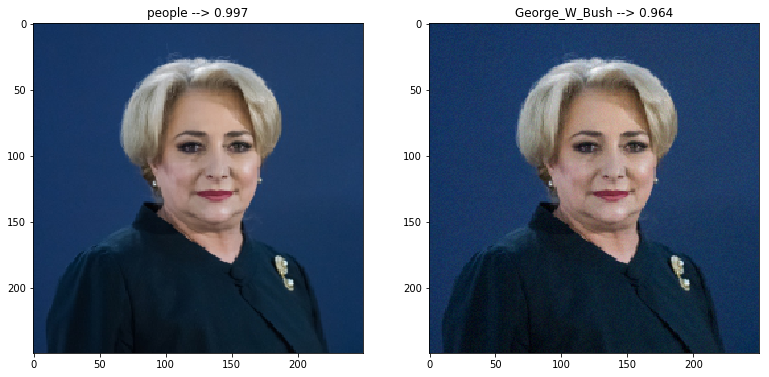

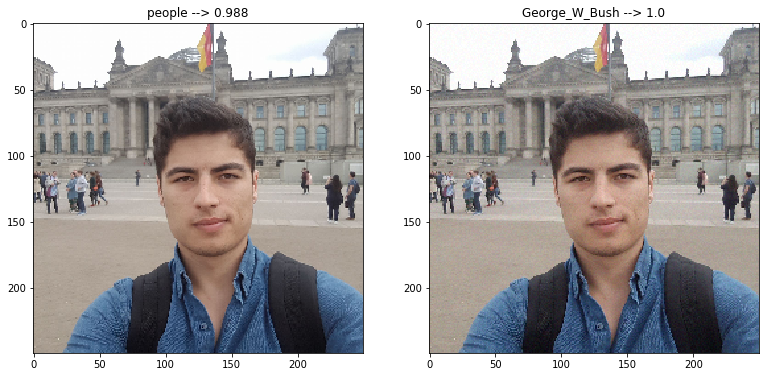

In [23]:
for _, row in list(test_df.iterrows())[:20]:
    
    original_array = np.expand_dims(row[IMG],axis=0)
    original_label_ohe = row[LABEL_OHE]
    original_pred_label = row[LABEL]
    original_pred = str(round(np.max(row[PRED]),3))
    
    plt.figure(figsize=(13,13))
    plt.subplot(1,2,1)
    plt.title(f"{original_pred_label} --> {original_pred}")
    plt.imshow(np.squeeze(original_array))

    ################### ADVERSARIAL CODE #######################
        
    target          = [0.0, 0.0, 1.0] # ohe label for Bush
    target_variable = K.variable(target)
    loss            = metrics.categorical_crossentropy(model.output, target_variable)
    gradients       = K.gradients(loss, model.input)
    get_grad_values = K.function([model.input], gradients)
    grad_values     = get_grad_values([original_array])[0]
    grad_signs = np.sign(grad_values)
    
    epsilon         = 4
    perturbation    = grad_signs * epsilon
    modified_array  = original_array - perturbation
    modified_array  = np.clip(modified_array, 0., 255.).astype(np.uint8)
    
    ################### ADVERSARIAL CODE #######################
    modified_pred_arr = model.predict(modified_array)
    modified_pred_label = index_2_class[np.argmax(modified_pred_arr)]
    modified_pred = str(round(np.max(modified_pred_arr),3))
    
    plt.subplot(1,2,2)
    plt.title(f"{modified_pred_label} --> {modified_pred}")
    plt.imshow(np.squeeze(modified_array))
    plt.show()
